In [1]:
import os 
print(os.getcwd())

/media/imagga/other/tedi/imagga/experiments/dev.bg


In [5]:
import requests
import json

from PIL import Image
from io import BytesIO
import numpy as np

import concurrent.futures
import requests
import json

import tritonclient.http as httpclient
import tritonclient.grpc as grpcclient

from tritonserver.models.detection.detection_utils import DetectionUtils
from tritonserver.models.classification.classification_utils import ClassificationUtils
from tritonserver.client.triton_client_utils import timeit, draw_boxes

In [6]:
import matplotlib.pyplot as plt

# Triton Inference Server

### Setup and requirements

### Checks

In [6]:
# !docker --version
# !python --version
# !conda --version
!nvidia-smi   # To check the NVIDIA GPU driver installation and version
!nvcc --version   # To check the CUDA Toolkit installation and version

Wed Mar 13 02:18:14 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-DGXS...  On   | 00000000:07:00.0 Off |                    0 |
| N/A   43C    P0    53W / 300W |  10831MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100-DGXS...  On   | 00000000:08:00.0 Off |                    0 |
| N/A   

## Triton Server Installation (Docker)

In [7]:
!docker images nvcr.io/nvidia/tritonserver*

REPOSITORY                    TAG             IMAGE ID       CREATED        SIZE
nvcr.io/nvidia/tritonserver   23.09-py3-min   55b901411b93   5 months ago   6.65GB
nvcr.io/nvidia/tritonserver   23.09-py3       f6f448fbf332   5 months ago   12.6GB
nvcr.io/nvidia/tritonserver   23.09-py3-sdk   ae634506bd7b   5 months ago   10.1GB


In [8]:
# Check
!docker pull nvcr.io/nvidia/tritonserver:23.09-py3

23.09-py3: Pulling from nvidia/tritonserver
Digest: sha256:70b869e4aeb40b30a6bda8b8e22b38800dd9384c9fbab97934b2b6c24d9aa8e8
Status: Image is up to date for nvcr.io/nvidia/tritonserver:23.09-py3
nvcr.io/nvidia/tritonserver:23.09-py3


## Code repository structure

In [9]:
!tree ./tritonserver/deploy/model_repository -I '__pycache__'

./tritonserver/deploy/model_repository
├── classification
│   ├── 1
│   │   └── model.pt
│   ├── config.pbtxt
│   └── labels.txt
├── classification_onnx
│   ├── 1
│   │   └── model.onnx
│   ├── config.pbtxt
│   └── labels.txt
├── classification_tensorrt
│   ├── 1
│   │   └── model.plan
│   ├── config.pbtxt
│   └── labels.txt
├── yolo_detection
│   ├── 1
│   │   ├── coco8.yaml
│   │   └── model.onnx
│   └── config.pbtxt
├── yolo_detection_dynamic_batching
│   ├── 1
│   │   ├── coco8.yaml
│   │   └── model.onnx
│   └── config.pbtxt
└── yolo_detection_multi_instances
    ├── 1
    │   ├── coco8.yaml
    │   └── model.onnx
    └── config.pbtxt

12 directories, 18 files


In [10]:
!cat ./tritonserver/deploy/model_repository/yolo_detection/config.pbtxt

name: "yolo_detection"
platform: "onnxruntime_onnx"
max_batch_size: 32
input {
  name: "images"
  data_type: TYPE_FP32
  dims: 3
  dims: 640
  dims: 640
}
output {
  name: "output0"
  data_type: TYPE_FP32
  dims: -1
  dims: -1
}


## Run Inference Server using docker

In [13]:
!cat ./tritonserver/deploy/Dockerfile

FROM nvcr.io/nvidia/tritonserver:23.09-py3 

RUN apt-get update

RUN pip install --upgrade pip


In [12]:
!cat ./tritonserver/deploy/docker-compose.yml

version: '1'

services:
  triton:
    build: .
    image: dev.bg-detection-triton
    container_name: dev.bg-detection-triton
    volumes:
      - ./model_repository:/models
    shm_size: 256m
    ports:
      - 127.0.0.1:18000:8000
      - 127.0.0.1:18001:8001
      - 127.0.0.1:18002:8002
    command: >
      
      tritonserver --model-repository=/models
      --log-verbose=3
      --log-info=1
      --log-warning=1
      --log-error=1
      
    stdin_open: true # docker run -i
    tty: true        # docker run -t
    
    restart: always
    deploy:
      resources:
        reservations:
          devices:
            - driver: nvidia
              capabilities: [ gpu ]
              device_ids: [ '2' ]

In [14]:
#container_id = !(docker compose --project-directory ./tritonserver/deploy/ up -d)

In [15]:
!docker ps | grep dev.bg*

ffe24b3808c9   dev.bg-detection-triton            "/opt/nvidia/nvidia_…"   8 hours ago    Up 7 hours    127.0.0.1:18000->8000/tcp, 127.0.0.1:18001->8001/tcp, 127.0.0.1:18002->8002/tcp   dev.bg-detection-triton


In [ ]:
 #!docker compose --project-directory ./tritonserver/deploy/ down

In [ ]:
#container_id

## Inference requests

### Using Python Requests to send HTTP call

In [16]:
!cat ./tritonserver/deploy/model_repository/yolo_detection/config.pbtxt

name: "yolo_detection"
platform: "onnxruntime_onnx"
max_batch_size: 32
input {
  name: "images"
  data_type: TYPE_FP32
  dims: 3
  dims: 640
  dims: 640
}
output {
  name: "output0"
  data_type: TYPE_FP32
  dims: -1
  dims: -1
}


In [33]:
DATASET_YAML = 'tritonserver/deploy/model_repository/yolo_detection/1/coco8.yaml'
labels = DetectionUtils.get_labels(DATASET_YAML)

In [13]:
response = requests.get("https://media.gettyimages.com/id/908295/photo/friends-television-stills-television.jpg?s=2048x2048&w=gi&k=20&c=To5471ZJLvWPVxlaQn4KDJInflG5Jd6htX3et7gk9w0=")
pil_img = Image.open(BytesIO(response.content))
imgs = [DetectionUtils.preprocess(np.asarray(pil_img), )]
input_images = np.array(imgs, dtype=np.float32)[0].tolist()

In [14]:
url = "http://localhost:18000/v2/models/yolo_detection/versions/1/infer"


payload = json.dumps({
  "inputs": [
    {
      "name": "images",
      "shape": [
        1,
        3,
        640,
        640
      ],
      "datatype": "FP32",
      "data": [
        input_images
      ]
    }
  ]
})
headers = {
  'Content-Type': 'application/json'
}

response = requests.request("POST", url, headers=headers, data=payload)
response_dict = json.loads(response.text)

In [15]:
response_dict.keys()

dict_keys(['model_name', 'model_version', 'outputs'])

In [16]:
print(response_dict['model_name'])
print(list(response_dict.keys()))

yolo_detection
['model_name', 'model_version', 'outputs']


In [17]:
print(response_dict['outputs'][0]['name'])
output_shape = response_dict['outputs'][0]['shape']
print(output_shape)

output0
[1, 25200, 85]


#### output checks

In [18]:
output_data = np.array(response_dict['outputs'][0]['data']).reshape(output_shape)
print(output_data.shape)

(1, 25200, 85)


In [19]:
imgs[0].shape[2: 4]

(640, 640)

In [20]:
pil_img.size

(1632, 2048)

In [21]:
output_data = response_dict['outputs'][0]['data']
len(output_data)

2142000

In [22]:
shape = response_dict['outputs'][0]['shape']
shape

[1, 25200, 85]

In [23]:
output_data = np.reshape(output_data, shape)
output_data.shape

(1, 25200, 85)

In [24]:
(output_data[0][0])
output_data.shape

(1, 25200, 85)

In [25]:
xc = output_data[..., 4] > 0.8 #conf_thres
filtered_output_data = output_data[xc]
print(len(filtered_output_data))
sample = filtered_output_data[1][0:85]

# bboxes
print(sample[0])
print(sample[1])
print(sample[2])
print(sample[3])

# confidence threshold
print(sample[4])

# classes
print(sample[5])
print(sample[27])

7
254.773681640625
367.05401611328125
75.24794006347656
300.18365478515625
0.813993513584137
0.9867714047431946
7.843971252441406e-05


#### output inference result

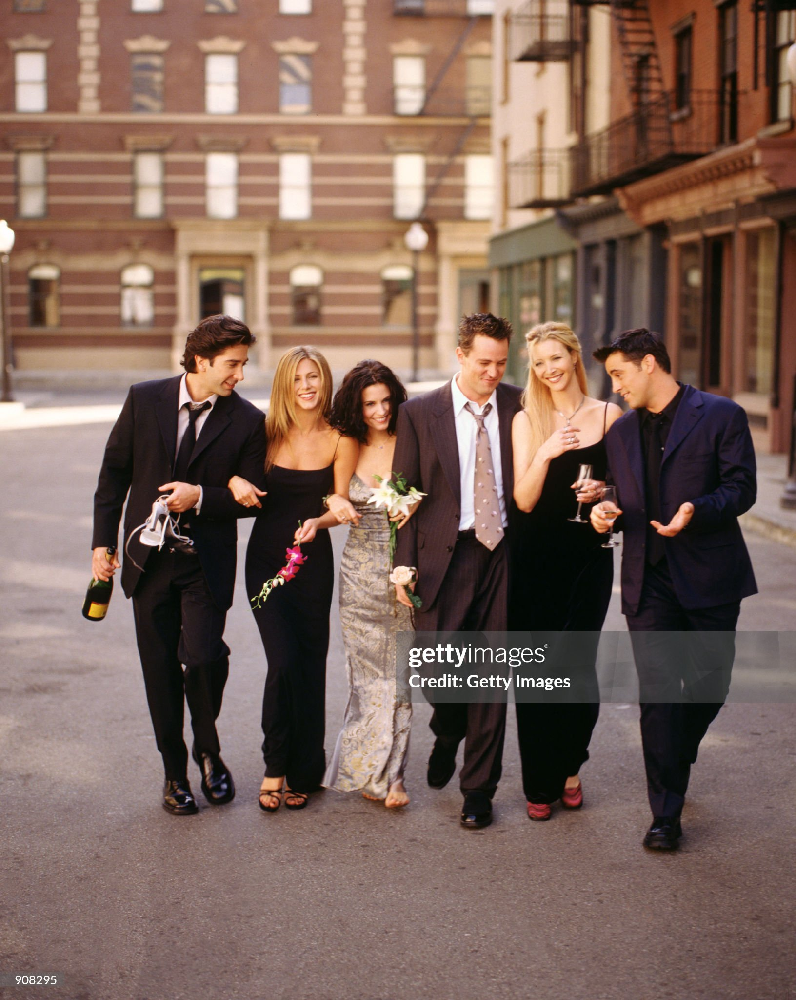

In [26]:
pil_img

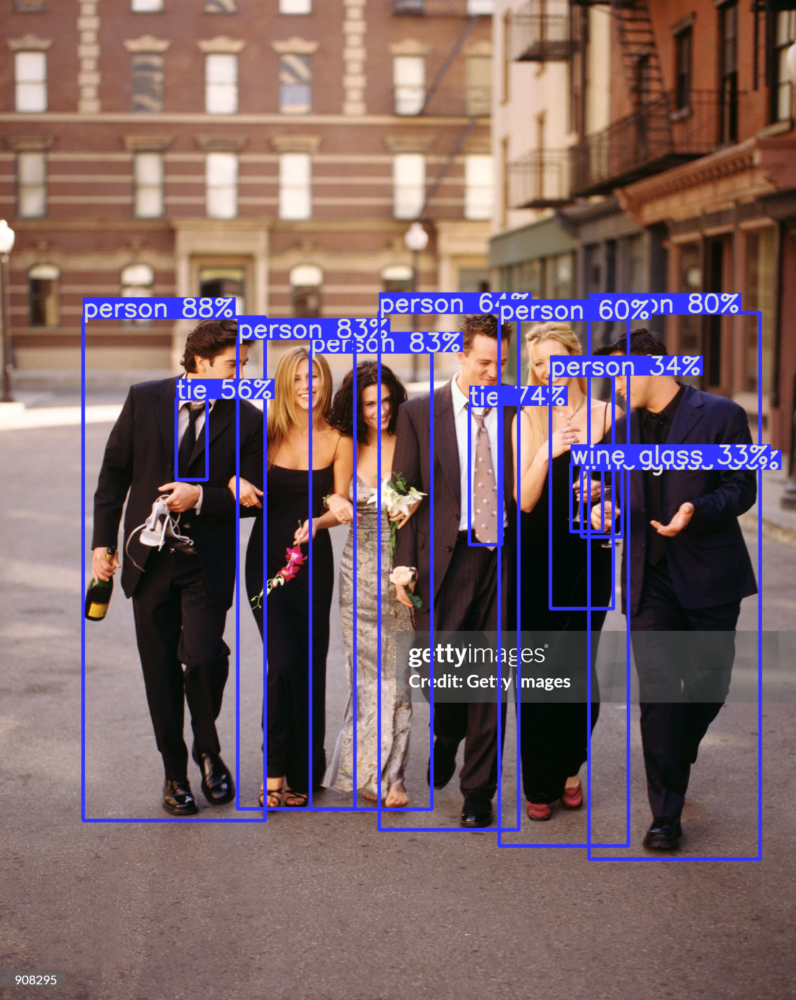

In [69]:
img = np.array(pil_img)
bboxes, scores, class_labels = DetectionUtils.postprocess(
    output_data, 
    origin_image_hw=img.shape[0: 2],
    model_input_hw=(640, 640),
    labels=labels)
img_to_show = Image.fromarray(draw_boxes(img, bboxes, scores, class_labels))     
img_to_show

### Using Python SDK to send GRPC call

In [34]:
import numpy as np
import tritonclient.grpc as grpcclient

class YoloDetection:
    
    def __init__(self, model_name):
        self.model_name = model_name
        self.input_meta = ('images', [1, 3, 640, 640], 'FP32')
        self.output_field = 'output0'

    
    def grpc_infer_call(self, input_images):                
        
        # client Initialisation
        triton_client = grpcclient.InferenceServerClient(url="localhost:18001", verbose=True)
        
        # input
        input_data = grpcclient.InferInput(*self.input_meta)
        input_data.set_data_from_numpy(input_images)
        inputs = [input_data]

        # outputs
        outputs = [grpcclient.InferRequestedOutput(self.output_field)]

        # send request
        response = triton_client.infer(model_name=self.model_name, inputs=inputs, outputs=outputs)
        
        # return output
        return response.as_numpy(self.output_field)

In [35]:
yolo_client = YoloDetection('yolo_detection')

preprocessed_images = np.array(DetectionUtils.preprocess(img))

results = yolo_client.grpc_infer_call(preprocessed_images)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [36]:
results.shape

(1, 25200, 85)

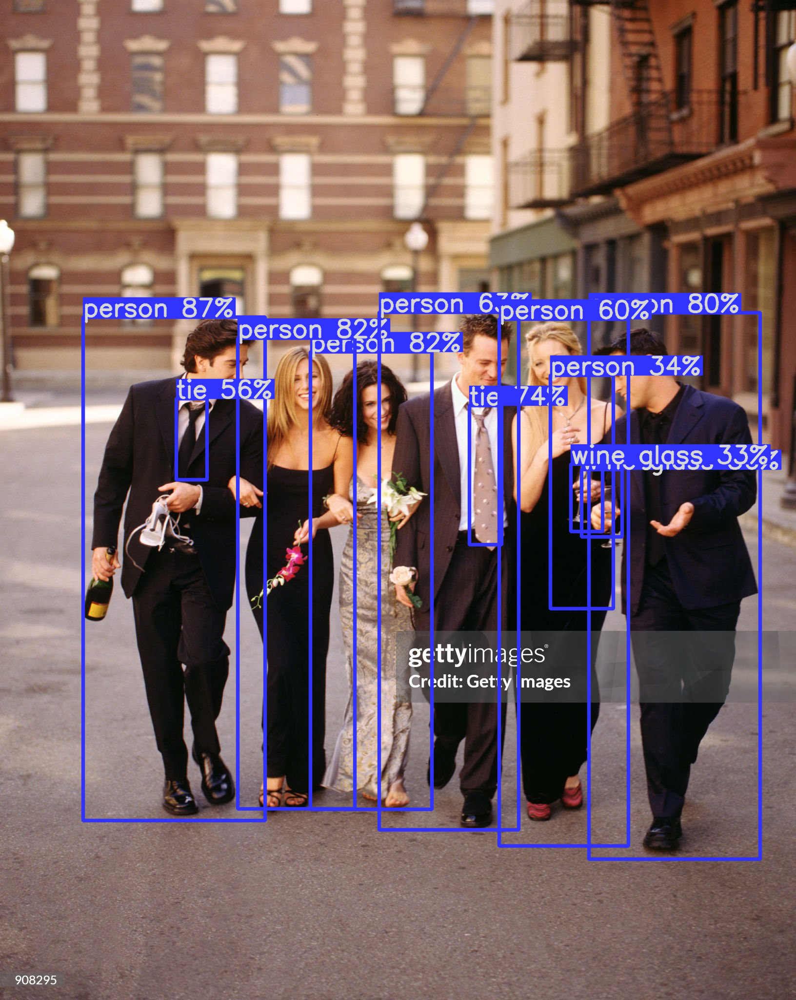

In [37]:
bboxes, scores, class_labels = DetectionUtils.postprocess(
    results, 
    origin_image_hw=img.shape[0: 2], 
    labels=labels)
img_to_show = Image.fromarray(draw_boxes(img, bboxes, scores, class_labels))     
img_to_show

## Health and Monitoring

## Health Check

In [67]:
triton_client = httpclient.InferenceServerClient(url="localhost:18000", verbose=True)

In [46]:
triton_client.is_server_live()

GET /v2/health/live, headers {}
<HTTPSocketPoolResponse status=200 headers={'content-length': '0', 'content-type': 'text/plain'}>


True

In [47]:
!curl -v localhost:18000/v2/health/ready

*   Trying 127.0.0.1:18000...
* Connected to localhost (127.0.0.1) port 18000 (#0)
> GET /v2/health/ready HTTP/1.1
> Host: localhost:18000
> User-Agent: curl/7.81.0
> Accept: */*
> 
* Mark bundle as not supporting multiuse
< HTTP/1.1 200 OK
< Content-Length: 0
< Content-Type: text/plain
< 
* Connection #0 to host localhost left intact


In [48]:
triton_client.is_server_ready()

GET /v2/health/ready, headers {}
<HTTPSocketPoolResponse status=200 headers={'content-length': '0', 'content-type': 'text/plain'}>


True

In [49]:
triton_client.is_model_ready('yolo_detection')

GET /v2/models/yolo_detection/ready, headers {}
<HTTPSocketPoolResponse status=200 headers={'content-length': '0', 'content-type': 'text/plain'}>


True

In [50]:
triton_client.get_model_metadata('yolo_detection')

GET /v2/models/yolo_detection, headers {}
<HTTPSocketPoolResponse status=200 headers={'content-type': 'application/json', 'content-length': '210'}>
bytearray(b'{"name":"yolo_detection","versions":["1"],"platform":"onnxruntime_onnx","inputs":[{"name":"images","datatype":"FP32","shape":[-1,3,640,640]}],"outputs":[{"name":"output0","datatype":"FP32","shape":[-1,-1,-1]}]}')


{'name': 'yolo_detection',
 'versions': ['1'],
 'platform': 'onnxruntime_onnx',
 'inputs': [{'name': 'images',
   'datatype': 'FP32',
   'shape': [-1, 3, 640, 640]}],
 'outputs': [{'name': 'output0', 'datatype': 'FP32', 'shape': [-1, -1, -1]}]}

### Metrics

In [68]:
print(json.dumps(triton_client.get_inference_statistics(),  indent=4))

GET /v2/models/stats, headers {}
<HTTPSocketPoolResponse status=200 headers={'content-type': 'application/json', 'content-length': '4537'}>
bytearray(b'{"model_stats":[{"name":"classification","version":"1","last_inference":1710302166524,"inference_count":1214,"execution_count":279,"inference_stats":{"success":{"count":279,"ns":6475229022},"fail":{"count":0,"ns":0},"queue":{"count":279,"ns":23210879},"compute_input":{"count":279,"ns":229745221},"compute_infer":{"count":279,"ns":5676301708},"compute_output":{"count":279,"ns":15957047},"cache_hit":{"count":0,"ns":0},"cache_miss":{"count":0,"ns":0}},"batch_stats":[{"batch_size":1,"compute_input":{"count":4,"ns":1053663},"compute_infer":{"count":4,"ns":794564980},"compute_output":{"count":4,"ns":602463}},{"batch_size":2,"compute_input":{"count":165,"ns":66761861},"compute_infer":{"count":165,"ns":2804979152},"compute_output":{"count":165,"ns":10078264}},{"batch_size":8,"compute_input":{"count":110,"ns":161929697},"compute_infer":{"count":1

In [55]:
import requests

url = "http://localhost:18002/metrics"

payload={}
headers = {}

response = requests.request("GET", url, headers=headers, data=payload)

print(response.text)

# HELP nv_inference_request_success Number of successful inference requests, all batch sizes
# TYPE nv_inference_request_success counter
nv_inference_request_success{model="classification_tensorrt",version="1"} 0
nv_inference_request_success{model="yolo_detection",version="1"} 5
nv_inference_request_success{model="classification_onnx",version="1"} 0
nv_inference_request_success{model="yolo_detection_dynamic_batching",version="1"} 10
nv_inference_request_success{model="yolo_detection_multi_instances",version="1"} 0
nv_inference_request_success{model="classification",version="1"} 0
# HELP nv_inference_request_failure Number of failed inference requests, all batch sizes
# TYPE nv_inference_request_failure counter
nv_inference_request_failure{model="classification_tensorrt",version="1"} 0
nv_inference_request_failure{model="yolo_detection",version="1"} 0
nv_inference_request_failure{model="classification_onnx",version="1"} 0
nv_inference_request_failure{model="yolo_detection_dynamic_batchi

# Optimisation Features

## Instance groups

In [56]:
!cat tritonserver/deploy/model_repository/yolo_detection_multi_instances/config.pbtxt

name: "yolo_detection_multi_instances"
platform: "onnxruntime_onnx"
max_batch_size: 32
input {
  name: "images"
  data_type: TYPE_FP32
  dims: 3
  dims: 640
  dims: 640
}
output {
  name: "output0"
  data_type: TYPE_FP32
  dims: -1
  dims: -1
}
instance_group [
  {
    count: 4
    kind: KIND_GPU
  }
]

### inference request

In [42]:
yolo_client = YoloDetection('yolo_detection')
        
def send_n_concurrent_requests(num_requests, input_images, url):

    def infer(request_num):

        preprocessed_images = np.array(DetectionUtils.preprocess(img))
        
        start_time = time.time()
        results = yolo_client.grpc_infer_call(preprocessed_images)
        end_time = time.time()
        return (end_time - start_time)
                
    
    response_times = []

    with concurrent.futures.ThreadPoolExecutor(max_workers=num_requests) as executor:
        for result in executor.map(infer, range(num_requests)):
            response_times.append(result)

    return sum(response_times)
    

In [59]:
t = send_n_concurrent_requests(10, input_images, "http://localhost:18000/v2/models/yolo_detection/versions/1/infer")


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [60]:
print(f"Total Time taken: {t} seconds")

Total Time taken: 24.25800323486328 seconds


In [61]:
t = send_n_concurrent_requests(10, input_images, "http://localhost:18000/v2/models/yolo_detection_multi_instances/versions/1/infer")

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [62]:
print(f"Total Time taken: {t} seconds")

Total Time taken: 14.581549406051636 seconds


## Dynamic Batching

In [63]:
!cat ./tritonserver/deploy/model_repository/yolo_detection_dynamic_batching/config.pbtxt

name: "yolo_detection_dynamic_batching"
platform: "onnxruntime_onnx"
max_batch_size: 32
input {
  name: "images"
  data_type: TYPE_FP32
  dims: 3
  dims: 640
  dims: 640
}
output {
  name: "output0"
  data_type: TYPE_FP32
  dims: -1
  dims: -1
}
dynamic_batching {
  max_queue_delay_microseconds: 100 
}

In [64]:

t = send_n_concurrent_requests(10, input_images, "http://localhost:18000/v2/models/yolo_detection_dynamic_batching/versions/1/infer")

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [65]:
print(f"Total Time taken: {t} seconds")

Total Time taken: 19.461561918258667 seconds


# Model Conversions - Pytorch, ONNX, TensorRT - benchmarks with HTTP and GRPC requests

In [29]:
def get_input_numpy_images():
    image_filepath = './tritonserver/images/briard.jpg'
    imgs = [ClassificationUtils.preprocess(image_filepath)]
    input_images = np.array(imgs, dtype=np.float32)
    return input_images
    
def http_classification_inference(input_images, url, batch_num=1):
    payload = json.dumps({
      "inputs": [
        {
          "name": "input",
          "shape": [
            batch_num,
            3,
            224,
            224
          ],
          "datatype": "FP32",
          "data": [
            input_images.tolist()
          ]
        }
      ]
    })
    headers = {
      'Content-Type': 'application/json'
    }

    response = requests.request("POST", url, headers=headers, data=payload)
    response_dict = json.loads(response.text)
    # print(response_dict)
    output = response_dict['outputs'][0]['data']
    return output

input_images = get_input_numpy_images()
print(input_images.shape)
output = http_classification_inference(input_images, url = 'http://localhost:18000/v2/models/classification/versions/1/infer')
labels = ClassificationUtils.get_labels('./tritonserver/deploy/model_repository/classification/labels.txt')
ClassificationUtils.postprocess([output], labels)

(1, 3, 224, 224)


{'result': {'categories': [{'confidence': 80.29293287625632,
    'name': {'en': 'briard'}}]},
 'status': {'text': '', 'type': 'success'}}

In [30]:
#copy from TRT
import torch
import time

def benchmark(url, device="cuda", input_shape=(2, 3, 224, 224), nwarmup=5, nruns=50):
    input_data = np.random.randint(255, size=input_shape)
    print(input_data.shape)
        
    print("Warm up ...")
    with torch.no_grad():
        for _ in range(nwarmup):
            output = http_classification_inference(input_data, url, batch_num=2)
    torch.cuda.synchronize()
    print("Start timing ...")
    timings = []
    with torch.no_grad():
        for i in range(1, nruns+1):
            start_time = time.time()
            output = http_classification_inference(input_data, url, batch_num=2)
            end_time = time.time()
            timings.append(end_time - start_time)
            if i%10==0:
                print('Iteration %d/%d, average batch time %.2f ms'%(i, nruns, np.mean(timings)*1000))

    print("Input shape:", input_data.shape)
    #print("Output features size:", len(output))
    print('Average batch time: %.2f ms'%(np.mean(timings)*1000))

In [31]:
benchmark('http://localhost:18000/v2/models/classification/versions/1/infer')

(2, 3, 224, 224)
Warm up ...
Start timing ...
Iteration 10/50, average batch time 151.88 ms
Iteration 20/50, average batch time 152.71 ms
Iteration 30/50, average batch time 152.91 ms
Iteration 40/50, average batch time 153.17 ms
Iteration 50/50, average batch time 151.76 ms
Input shape: (2, 3, 224, 224)
Average batch time: 151.76 ms


In [32]:
benchmark('http://localhost:18000/v2/models/classification_onnx/versions/1/infer')

(2, 3, 224, 224)
Warm up ...
Start timing ...
Iteration 10/50, average batch time 143.28 ms
Iteration 20/50, average batch time 145.22 ms
Iteration 30/50, average batch time 145.57 ms
Iteration 40/50, average batch time 146.15 ms
Iteration 50/50, average batch time 146.10 ms
Input shape: (2, 3, 224, 224)
Average batch time: 146.10 ms


In [84]:
benchmark('http://localhost:18000/v2/models/classification_tensorrt/versions/1/infer')

(2, 3, 224, 224)
Warm up ...
Start timing ...
Iteration 10/50, average batch time 135.32 ms
Iteration 20/50, average batch time 138.14 ms
Iteration 30/50, average batch time 140.95 ms
Iteration 40/50, average batch time 139.42 ms
Iteration 50/50, average batch time 138.12 ms
Input shape: (2, 3, 224, 224)
Average batch time: 138.12 ms


In [85]:
triton_client = grpcclient.InferenceServerClient(
    url='localhost:18001',
    verbose=False,
    ssl=False)

def grcp_classification_inference(preprocessed_images, model_name):
    infer_input = grpcclient.InferInput(
        'input', preprocessed_images.shape, datatype='FP32')
    infer_input.set_data_from_numpy(preprocessed_images)#, binary_data=True)

    infer_output = grpcclient.InferRequestedOutput('output')

    response = triton_client.infer(
        model_name=model_name, 
        inputs=[infer_input], 
        outputs=[infer_output])

    raw_result = response.as_numpy('output')

    return raw_result
    

input_images = get_input_numpy_images()
print(input_images.shape)
output = grcp_classification_inference(input_images, 'classification')
labels = ClassificationUtils.get_labels('./tritonserver/deploy/model_repository/classification/labels.txt')
ClassificationUtils.postprocess(output, labels)

(1, 3, 224, 224)


{'result': {'categories': [{'confidence': 80.29292821884155,
    'name': {'en': 'briard'}}]},
 'status': {'text': '', 'type': 'success'}}

In [86]:
def benchmark_grcp(model_name, input_shape=(8, 3, 224, 224), nwarmup=5, nruns=50):
    input_data = np.array(np.random.randint(0, 255, size=input_shape), dtype="float32")
        
    print("Warm up ...")
    for _ in range(nwarmup):
        output = grcp_classification_inference(input_data, model_name)

    print("Start timing ...")
    timings = []
    with torch.no_grad():
        for i in range(1, nruns+1):
            start_time = time.time()
            output = grcp_classification_inference(input_data, model_name)
            end_time = time.time()
            timings.append(end_time - start_time)
            if i%10==0:
                print('Iteration %d/%d, ave batch time %.2f ms'%(i, nruns, np.mean(timings)*1000))

    print("Input shape:", input_data.shape)
    #print("Output features size:", len(output))
    print('Average batch time: %.2f ms'%(np.mean(timings)*1000))

In [87]:
benchmark_grcp('classification')

Warm up ...
Start timing ...
Iteration 10/50, ave batch time 24.79 ms
Iteration 20/50, ave batch time 24.44 ms
Iteration 30/50, ave batch time 24.33 ms
Iteration 40/50, ave batch time 24.39 ms
Iteration 50/50, ave batch time 24.42 ms
Input shape: (8, 3, 224, 224)
Average batch time: 24.42 ms


In [88]:
benchmark_grcp('classification_onnx')

Warm up ...
Start timing ...
Iteration 10/50, ave batch time 17.83 ms
Iteration 20/50, ave batch time 17.91 ms
Iteration 30/50, ave batch time 18.38 ms
Iteration 40/50, ave batch time 18.57 ms
Iteration 50/50, ave batch time 18.85 ms
Input shape: (8, 3, 224, 224)
Average batch time: 18.85 ms


In [89]:
benchmark_grcp('classification_tensorrt')

Warm up ...
Start timing ...
Iteration 10/50, ave batch time 16.10 ms
Iteration 20/50, ave batch time 15.92 ms
Iteration 30/50, ave batch time 16.08 ms
Iteration 40/50, ave batch time 16.36 ms
Iteration 50/50, ave batch time 16.25 ms
Input shape: (8, 3, 224, 224)
Average batch time: 16.25 ms
